# Household power consumption in 2007
### Understanding Data and Data Preparation

- Data Preprocessing
- Data cleaning and munging
- EDA

In [153]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


# RUN THIS!!!

In [154]:
df = df = pd.read_csv('data/household_power_consumption.csv')  #as i save the csv in data folder
df.head()

,index,Date,Time,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
0,0,1/1/07,0:00:00,2.58,0.136,241.97,10.6,0,0,0.0
1,1,1/1/07,0:01:00,2.552,0.1,241.75,10.4,0,0,0.0
2,2,1/1/07,0:02:00,2.55,0.1,241.64,10.4,0,0,0.0
3,3,1/1/07,0:03:00,2.55,0.1,241.71,10.4,0,0,0.0
4,4,1/1/07,0:04:00,2.554,0.1,241.98,10.4,0,0,0.0


## issue with formatting the column 
at first, there is only null for df['Sub_metering_3'], but the issue is,(without any munging or cleaning)

1. date and time is not in the right format
2. columns : `['Global_active_power', 'Global_reactive_power',
       'Voltage', 'Global_intensity', 'Sub_metering_1', 'Sub_metering_2']` 
   are all dtype as object, so it cannot passed any EDA and analysis'
   
The plan:
1. covert Date and Tiem into appropriate format
2. Handle the issue with the numerical column but classififed as ibject, by fill either '?' or 'NaN' with the mean or mode


New issue after filling the '?' and 'NaN':
1. suddenly there are many null value inside the columns, 


## Understanding Data

In [155]:
df.isnull().sum()

index                       0
Date                        0
Time                        0
Global_active_power         0
Global_reactive_power       0
Voltage                     0
Global_intensity            0
Sub_metering_1              0
Sub_metering_2              0
Sub_metering_3           3771
dtype: int64

In [156]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 260640 entries, 0 to 260639
Data columns (total 10 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   index                  260640 non-null  int64  
 1   Date                   260640 non-null  object 
 2   Time                   260640 non-null  object 
 3   Global_active_power    260640 non-null  object 
 4   Global_reactive_power  260640 non-null  object 
 5   Voltage                260640 non-null  object 
 6   Global_intensity       260640 non-null  object 
 7   Sub_metering_1         260640 non-null  object 
 8   Sub_metering_2         260640 non-null  object 
 9   Sub_metering_3         256869 non-null  float64
dtypes: float64(1), int64(1), object(8)
memory usage: 19.9+ MB


In [157]:
df.columns

Index(['index', 'Date', 'Time', 'Global_active_power', 'Global_reactive_power',
       'Voltage', 'Global_intensity', 'Sub_metering_1', 'Sub_metering_2',
       'Sub_metering_3'],
      dtype='object')

### Cleaning Data

In [158]:
df=df.drop('index',axis=1)
#drop index column

As when we df['Date'] = pd.to_datetime(df['Date']), it only able to format the dd/mm/yy and not dd/mm/yyyy
so do a function,so that, the First attempt parsing with the DD/MM/YY format.
For dates that fail (result in NaT), attempt parsing with the DD/MM/YYYY format.

In [194]:
df['Date'] = pd.to_datetime(df['Date'], format='%d/%m/%y', errors='coerce')

# For dates that resulted in NaT (Not a Time), attempt parsing with DD/MM/YYYY format
#df['Date'] = df['Date'].fillna(pd.to_datetime(df['Date'], format='%d/%m/%Y', errors='coerce'))

df['Time'] = pd.to_datetime(df['Time'], format='%H:%M:%S').dt.time
#df['Time'] = pd.to_datetime(df['Time'])
df.head()

,Date,Time,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
0,2007-01-01,00:00:00,2.580,0.136,241.97,10.6,0.0,0.0,0.0
1,2007-01-01,00:01:00,2.552,0.100,241.75,10.4,0.0,0.0,0.0
2,2007-01-01,00:02:00,2.550,0.100,241.64,10.4,0.0,0.0,0.0
3,2007-01-01,00:03:00,2.550,0.100,241.71,10.4,0.0,0.0,0.0
4,2007-01-01,00:04:00,2.554,0.100,241.98,10.4,0.0,0.0,0.0


In [160]:
has_nat = df['Date'].isna().any()
print(f"Are there any NaT values in the Date column? {has_nat}")

if has_nat:
    # Display the rows with NaT values in the Date column
    nat_rows = df[df['Date'].isna()]
    print("Rows with NaT in the Date column:")
    print(nat_rows)
    

Are there any NaT values in the Date column? False


In [161]:
df.isnull().sum()

Date                        0
Time                        0
Global_active_power         0
Global_reactive_power       0
Voltage                     0
Global_intensity            0
Sub_metering_1              0
Sub_metering_2              0
Sub_metering_3           3771
dtype: int64

#Slicing the Date column for specific row indices
date_slice1 = df['Date'].iloc[17280:17285]  # Rows 17280 to 17284 inclusive
date_slice2 = df['Date'].iloc[260635:260640]  # Rows 260635 to 260639 inclusive
#Concatenating the slices
date_slice = pd.concat([date_slice1, date_slice2])

print(date_slice)

#ok ja format date, kenapa bila convert, dia jadi NaT

#df['Date'] = pd.to_datetime(df['Date'])
#Define a function to handle different date formats
#Combine handling of both formats with dayfirst=True
def parse_dates(date_str):
    for fmt in ('%m/%d/%y', '%d/%m/%y', '%Y-%m-%d'):
        try:
            return pd.to_datetime(date_str, format=fmt)
        except (ValueError, TypeError):
            continue
    return pd.NaT

#Apply the function to the Date column
df['Date'] = df['Date'].apply(parse_dates)

df['Time'] = pd.to_datetime(df['Time'], format='%H:%M:%S').dt.time
#df=df.sort_values('Date') ady sorted in the table
df.head()

## specify datetime format, but this one above is nice ady
#convert time and date column to pd.to_datetime
#df['Date'] = pd.to_datetime(df['Date'])
#df['Time'] = pd.to_datetime(df['Time'])
#df=df.sort_values('Date')  #kena specifiy format
#Specify the format for the Date column
#Specify the correct format for the Date column
#Define a function to handle different date formats
def parse_dates(date_str):
    for fmt in ('%m/%d/%y', '%d/%m/%y', '%Y-%m-%d'):
        try:
            return pd.to_datetime(date_str, format=fmt)
        except (ValueError, TypeError):
            continue
    return pd.NaT

#Apply the function to the Date column
df['Date'] = df['Date'].apply(parse_dates)

#Specify the format for the Time column
df['Time'] = pd.to_datetime(df['Time'], format='%H:%M:%S').dt.time
df=df.sort_values('Date')
#UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format. df['Time'] = pd.to_datetime(df['Time'])

### even when the data is in numeric, df.info() list these column as object, check using unique value and handle the problem

Now after turn them to float, they have '..' and '?' NaN

In [195]:
print(df['Global_active_power'].unique())
#If there might be leading or trailing whitespace, strip them.
#df['Global_active_power'] = df['Global_active_power'].str.strip()  # ada ...
#Use pd.to_numeric to convert the column to numeric, coercing any errors to NaN.
df['Global_active_power'] = pd.to_numeric(df['Global_active_power'], errors='coerce')
print(df['Global_active_power'].dtype) #verify the conversion
#lepas tukar str ke float,... still ada,kita replace dia dengan mean or anything
#mean_meter_3 = 
#df['Global_active_power'].replace('...', np.nan, inplace=True)
#df['Global_active_power'].fillna(df['Global_active_power'].mean(), inplace=True)
print(df['Global_active_power'].unique())
# ada ...


[2.58  2.552 2.55  ... 7.022 4.592 6.152]
float64
[2.58  2.552 2.55  ... 7.022 4.592 6.152]


In [196]:
print(df['Voltage'].unique())
# This likely happened because the numerical values are stored as strings. 
df['Voltage'] = pd.to_numeric(df['Voltage'], errors='coerce')
#df['Voltage'] = df['Voltage'].replace('...', np.nan)
print(df['Voltage'].dtype)
print(df['Voltage'].unique())
#ada ...

[241.97 241.75 241.64 ... 226.68 227.38 228.6 ]
float64
[241.97 241.75 241.64 ... 226.68 227.38 228.6 ]


In [197]:
#unique too long
#indicate that there is a non-numeric value '?' in the column. This is likely 
#the reason why the column is detected as an object type
df['Global_reactive_power'] = df['Global_reactive_power'].replace('?', np.nan)
df['Global_reactive_power'] = pd.to_numeric(df['Global_reactive_power'], errors='coerce')
print(df['Global_reactive_power'].dtype)
print(df['Global_reactive_power'].unique())
#ada nan

float64
[0.136 0.1   0.096 0.    0.092 0.116 0.118 0.218 0.258 0.252 0.25  0.248
 0.256 0.254 0.214 0.132 0.216 0.148 0.128 0.126 0.124 0.13  0.102 0.106
 0.104 0.052 0.12  0.122 0.048 0.088 0.108 0.082 0.134 0.14  0.138 0.142
 0.144 0.086 0.084 0.15  0.23  0.234 0.236 0.18  0.242 0.264 0.262 0.26
 0.246 0.07  0.114 0.146 0.232 0.224 0.112 0.11  0.158 0.244 0.24  0.204
 0.074 0.358 0.362 0.364 0.36  0.21  0.064 0.19  0.228 0.182 0.226 0.184
 0.068 0.172 0.09  0.212 0.2   0.08  0.094 0.098 0.062 0.078 0.066 0.072
 0.054 0.206 0.222 0.202 0.188 0.076 0.238 0.198 0.186 0.046 0.168 0.152
 0.402 0.454 0.448 0.446 0.442 0.44  0.438 0.434 0.43  0.424 0.336 0.32
 0.318 0.316 0.272 0.268 0.266 0.156 0.16  0.162 0.164 0.154 0.174 0.166
 0.27  0.17  0.056 0.296 0.354 0.346 0.22  0.178 0.28  0.276 0.278 0.352
 0.382 0.38  0.39  0.384 0.282 0.284 0.274 0.394 0.386 0.288 0.286 0.06
 0.176 0.294 0.4   0.42  0.418 0.31  0.308 0.306 0.304 0.29  0.292 0.348
 0.344 0.322 0.194 0.192 0.058 0.05  0.196 0.3

In [198]:
df['Global_intensity'].unique()
#contains a non-numeric value '?'
df['Global_intensity'] = df['Global_intensity'].replace('?', np.nan)
#Replace the '?' with NaN.
df['Global_intensity'] = pd.to_numeric(df['Global_intensity'], errors='coerce')
print(df['Global_intensity'].dtype)
#ada ? ganti dengan nan
print(df['Global_intensity'].unique())

float64
[10.6 10.4 10.2 11.  10.8 11.4 10.   9.8 14.6 14.2 14.4 12.4 11.6  9.6
 11.2  0.8  1.   1.4  7.2 12.8  1.6  2.8  3.2  3.   2.6  2.4  2.   5.6
  6.   5.4  5.2  5.8  6.4  6.2  8.4  6.6  7.   6.8  7.4  8.2  9.2  2.2
  1.8  5.   4.2  7.6  9.   8.8  9.4  4.4  8.6 12.2 13.4 13.2 13.  12.
  8.   7.8 11.8 15.6 16.4  4.8  4.6  3.6  4.   1.2  3.4  3.8 15.  14.8
 20.8 21.2 16.6 19.4 23.8 24.4 24.6 23.6 23.  22.8 22.4 21.4 17.4 24.8
 21.  20.4 12.6 18.8 19.  19.2 13.6 15.2 16.  15.4 15.8 18.2 14.  24.2
 16.2 20.2 13.8 16.8 17.  25.  25.2 17.6 17.2 18.6 21.8 20.6 19.6 19.8
 22.  23.2 18.4 22.2 22.6 23.4 18.  17.8 20.  25.8 32.8 35.6 32.  24.
 21.6 25.4 26.6 27.8 28.  28.6 29.4 28.8 28.2 29.2 27.6 30.8 33.6 33.8
 31.6 27.2 27.  26.8 28.4 29.  26.2 32.6 34.4 35.2 33.4 36.  37.2 34.
 34.8 32.2 31.2 29.6 25.6 32.4 33.2 30.6 27.4 29.8 31.8 36.6 26.  26.4
 30.2 33.  40.4 37.4 30.4 31.  34.2 38.2 36.4 36.2 35.4 34.6 31.4 30.
 35.8 39.2 35.  38.  40.2 41.  41.4 41.2 41.8 38.6 44.4 46.4 43.2 39.8
 4

In [199]:
print(df['Sub_metering_1'].unique())
#'32' '15' '?' '45' '42'
# Replace '?' with NaN
df['Sub_metering_1'] = df['Sub_metering_1'].replace('?', np.nan)

# Convert the column to numeric (float)
df['Sub_metering_1'] = pd.to_numeric(df['Sub_metering_1'], errors='coerce')
print(df['Sub_metering_1'].dtype)
print(df['Sub_metering_1'].unique())
#ada?, ganti dengan nan

[ 0.  1.  2. 11. 39. 38. 37.  4. 34.  3. 14. 25.  8. 31. 21.  9. 35. 36.
 13. 28. 12. 17.  6.  7. 29. 10. 22. 24. 20.  5. 27. 23. 30. 18. 19. 16.
 33. 40. 26. 64. 71. 58. 56. 72. 32. 15. 45. 42. 75. 59. 66. 43. 41. 44.
 48. 46. 73. 55. 74. 60. 70. 76. 68. 63. 67. 47. 65. 51. 50. 69. 78. 77.
 57. 62. 49. 61. 53. 52.]
float64
[ 0.  1.  2. 11. 39. 38. 37.  4. 34.  3. 14. 25.  8. 31. 21.  9. 35. 36.
 13. 28. 12. 17.  6.  7. 29. 10. 22. 24. 20.  5. 27. 23. 30. 18. 19. 16.
 33. 40. 26. 64. 71. 58. 56. 72. 32. 15. 45. 42. 75. 59. 66. 43. 41. 44.
 48. 46. 73. 55. 74. 60. 70. 76. 68. 63. 67. 47. 65. 51. 50. 69. 78. 77.
 57. 62. 49. 61. 53. 52.]


In [200]:
 #to check why object
#'66' '61' '?' '44'
# Replace '?' with NaN
df['Sub_metering_2'] = df['Sub_metering_2'].replace('?', np.nan)
# Convert the column to numeric (float)
df['Sub_metering_2'] = pd.to_numeric(df['Sub_metering_2'], errors='coerce')
print(df['Sub_metering_2'].dtype)
print(df['Sub_metering_2'].unique())
# ? ganti dengan nan

float64
[ 0.  1.  2.  6. 39. 38. 10. 13.  4.  5.  8. 37. 29. 48. 72. 73. 74. 42.
 36. 24. 28. 40. 41. 30. 22. 23. 27. 25. 34. 17. 19. 16. 32. 15.  7.  3.
 31. 64. 75. 63. 26. 20. 35. 21. 18. 14. 12. 33.  9. 50. 65. 47. 43. 11.
 67. 69. 70. 62. 71. 46. 58. 57. 60. 66. 61. 44. 78. 77. 76. 53. 56. 51.
 49. 68. 59. 55. 52. 45. 54.]


In [168]:
df.isnull().sum()
#as we already converted the numerical column from object to float,now suddenly there are nulls, when there is no null before

Date                        0
Time                        0
Global_active_power      3771
Global_reactive_power    3771
Voltage                  3771
Global_intensity         3771
Sub_metering_1           3771
Sub_metering_2           3771
Sub_metering_3           3771
dtype: int64

##### fill the nan with mean

In [201]:
mean_intensity = df['Global_intensity'].mean()
df['Global_intensity'].fillna(mean_intensity, inplace=True)

In [202]:
mean_meter_1 = df['Sub_metering_1'].mean()
df['Sub_metering_1'].fillna(mean_meter_1, inplace=True)

In [203]:
mean_meter_2 = df['Sub_metering_2'].mean()
df['Sub_metering_2'].fillna(mean_meter_2, inplace=True)

In [204]:
mean_reactive = df['Global_reactive_power'].mean()
df['Global_reactive_power'].fillna(mean_reactive, inplace=True)

In [205]:
print(df['Sub_metering_3'].unique())
#there is nan
#10.  2. nan 20.]
mean_meter_3 = df['Sub_metering_3'].mean()
df['Sub_metering_3'].fillna(mean_meter_3, inplace=True)
#df['Sub_metering_3']=df['Sub_metering_3'].fillna(method='bfill')
#
print(df['Sub_metering_3'].dtype)
print(df['Sub_metering_3'].unique())

[ 0. 16. 18. 17.  9. 12. 19.  5.  1. 14. 15. 13.  4.  6.  8.  7.  3. 11.
 10.  2. 20.]
float64
[ 0. 16. 18. 17.  9. 12. 19.  5.  1. 14. 15. 13.  4.  6.  8.  7.  3. 11.
 10.  2. 20.]


In [206]:
df.isnull().sum()

Date                     0
Time                     0
Global_active_power      0
Global_reactive_power    0
Voltage                  0
Global_intensity         0
Sub_metering_1           0
Sub_metering_2           0
Sub_metering_3           0
dtype: int64

In [207]:
df.head(3)

,Date,Time,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
0,2007-01-01,00:00:00,2.580,0.136,241.97,10.6,0.0,0.0,0.0
1,2007-01-01,00:01:00,2.552,0.100,241.75,10.4,0.0,0.0,0.0
2,2007-01-01,00:02:00,2.550,0.100,241.64,10.4,0.0,0.0,0.0


In [208]:
def analyze_dataframe(df):
    # new dataframe to store new df just for our ref
    result_df = pd.DataFrame(index=df.columns, columns=['Unique Values', 'Missing Values', 'Total Rows'])
    # Get the total number of rows
    total_rows = df.shape[0]
    # now the new df must be filled with info for the column
    for column in df.columns:
        unique_values = df[column].nunique()  #to call unique value from each column
        missing_values = df[column].isnull().sum()  #to check how many null for each row 

        result_df.loc[column] = [unique_values, missing_values, total_rows] #to loc whole colun and rows into result_df2
    return result_df

In [209]:
analyze_dataframe(df)

,Unique Values,Missing Values,Total Rows
Date,180,0,256869
Time,1440,0,256869
Global_active_power,3584,0,256869
Global_reactive_power,413,0,256869
Voltage,2275,0,256869
Global_intensity,199,0,256869
Sub_metering_1,78,0,256869
Sub_metering_2,79,0,256869
Sub_metering_3,21,0,256869


In [210]:
df.isnull().sum()

Date                     0
Time                     0
Global_active_power      0
Global_reactive_power    0
Voltage                  0
Global_intensity         0
Sub_metering_1           0
Sub_metering_2           0
Sub_metering_3           0
dtype: int64

### Manage null

In [179]:
#df.dropna(subset=['Global_active_power', 'Voltage'], inplace=True)

In [211]:
#after drop all null 
analyze_dataframe(df)
#rows lessen from 260640 to 256869
#date and sub-metering 3 loss one unique value

,Unique Values,Missing Values,Total Rows
Date,180,0,256869
Time,1440,0,256869
Global_active_power,3584,0,256869
Global_reactive_power,413,0,256869
Voltage,2275,0,256869
Global_intensity,199,0,256869
Sub_metering_1,78,0,256869
Sub_metering_2,79,0,256869
Sub_metering_3,21,0,256869


In [213]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 256869 entries, 0 to 260639
Data columns (total 9 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   Date                   256869 non-null  datetime64[ns]
 1   Time                   256869 non-null  object        
 2   Global_active_power    256869 non-null  float64       
 3   Global_reactive_power  256869 non-null  float64       
 4   Voltage                256869 non-null  float64       
 5   Global_intensity       256869 non-null  float64       
 6   Sub_metering_1         256869 non-null  float64       
 7   Sub_metering_2         256869 non-null  float64       
 8   Sub_metering_3         256869 non-null  float64       
dtypes: datetime64[ns](1), float64(7), object(1)
memory usage: 19.6+ MB


In [214]:
df.describe().transpose()

,count,mean,min,25%,50%,75%,max,std
Date,256869,2007-05-06 05:26:45.311656960,2007-01-01 00:00:00,2007-02-26 00:00:00,2007-04-24 00:00:00,2007-06-22 00:00:00,2007-12-06 00:00:00,NaN
Global_active_power,256869.0,1.164937,0.082,0.296,0.564,1.606,10.67,1.181832
Global_reactive_power,256869.0,0.123729,0.0,0.0,0.104,0.194,1.148,0.111872
Voltage,256869.0,239.208981,223.49,236.65,239.61,241.81,250.89,3.592793
Global_intensity,256869.0,4.974755,0.4,1.4,2.6,6.8,46.4,4.999493
Sub_metering_1,256869.0,1.332481,0.0,0.0,0.0,0.0,78.0,6.70497
Sub_metering_2,256869.0,1.67061,0.0,0.0,0.0,1.0,78.0,6.631361
Sub_metering_3,256869.0,5.831825,0.0,0.0,0.0,17.0,20.0,8.186709


## Explore the data (EDA)

### 1. univariate non-graphical EDA

In [215]:
df.groupby('Date').mean('agg').T
#aggregates=agg

Date,2007-01-01,2007-01-02,2007-01-03,2007-01-04,2007-01-05,2007-01-06,2007-01-13,2007-01-14,2007-01-15,2007-01-16,...,2007-11-03,2007-11-04,2007-11-05,2007-11-06,2007-12-01,2007-12-02,2007-12-03,2007-12-04,2007-12-05,2007-12-06
Global_active_power,1.909031,1.267194,0.359419,1.934689,1.155457,0.726142,2.213065,2.090213,1.492137,1.171114,...,2.417108,0.616307,0.679968,0.551843,1.014789,1.303896,1.354631,0.373407,1.001088,0.638032
Global_reactive_power,0.102893,0.104350,0.074742,0.140661,0.126117,0.099501,0.201900,0.157832,0.121431,0.128769,...,0.120399,0.133643,0.091733,0.135163,0.138292,0.094933,0.093349,0.102647,0.145258,0.150289
Voltage,240.128979,240.392139,241.321403,240.024486,234.678701,235.323322,239.283611,238.821849,241.240910,241.944757,...,240.007292,241.154826,235.229757,240.856750,241.538208,240.098500,240.558715,240.256062,234.722903,240.224896
Global_intensity,7.916944,5.332500,1.508889,8.149444,5.073333,3.135650,9.453056,8.968311,6.261528,4.975972,...,10.121528,2.618750,3.027639,2.417917,4.309167,5.503472,5.728472,1.597917,4.360556,2.858611
Sub_metering_1,0.000000,0.812500,0.000000,3.214583,2.781250,0.000000,5.420833,1.234885,0.763194,1.432639,...,3.340278,0.000000,0.643056,0.000000,0.000000,1.546528,0.974306,0.000000,1.560417,1.306944
Sub_metering_2,0.244444,0.268056,0.219444,3.750694,0.690972,0.335650,2.065972,2.929117,1.554861,0.447222,...,2.375000,0.772222,0.340972,0.338194,0.304861,0.277083,1.972917,0.375694,0.746528,0.329861
Sub_metering_3,4.083333,9.128472,1.375000,13.547917,5.934722,5.325921,7.875694,9.016678,10.529861,4.571528,...,6.597222,4.459028,4.493750,3.700000,5.747222,7.997917,8.578472,1.262500,7.227778,2.706944


In [216]:
# Calculate the average voltage for each month
average_voltage_per_month = df.groupby(df['Date'].dt.month)['Voltage'].mean()

# Find the month with the highest average voltage
highest_voltage_month = average_voltage_per_month.idxmax()  # idxmax() returns the index of the maximum value

# Find the highest voltage reading for the highest voltage month
highest_voltage_reading = df[df['Date'].dt.month == highest_voltage_month]['Voltage'].max()

# Print the result
print("Month with the highest average voltage:", highest_voltage_month)
print("Highest voltage reading for this month:", highest_voltage_reading)

Month with the highest average voltage: 1
Highest voltage reading for this month: 250.89


# I NEED TO KNOW THIS
why NaN when Date and Time is specified the type when formatting?

### 2. Bivariate Non-graphical EDA

In [221]:
df['Voltage'].isna().any()

False

In [218]:
df[(df['Date'].dt.month == 2) & (df['Time'] == '00:00:00')]['Voltage'].mean()

nan

In [217]:
Usage_in_February = df[(df['Date'].dt.month == 2) & (df['Time'] == '00:00:00')]['Voltage'].mean()
print("Average Voltage in February at 00:00:00:", Usage_in_February)
#bila format time guna specific HMS, dia tak detect and jadi nan, terpaksa guna secara am datetime (kat atas waktu nak convert)

#I used .dt.month == 2 to filter the DataFrame for February dates.
#I used '00:00:00' as a string to filter for that specific time.

Average Voltage in February at 00:00:00: nan


## Visualization of Data
### 3. Graphical EDA

## Detect outliers

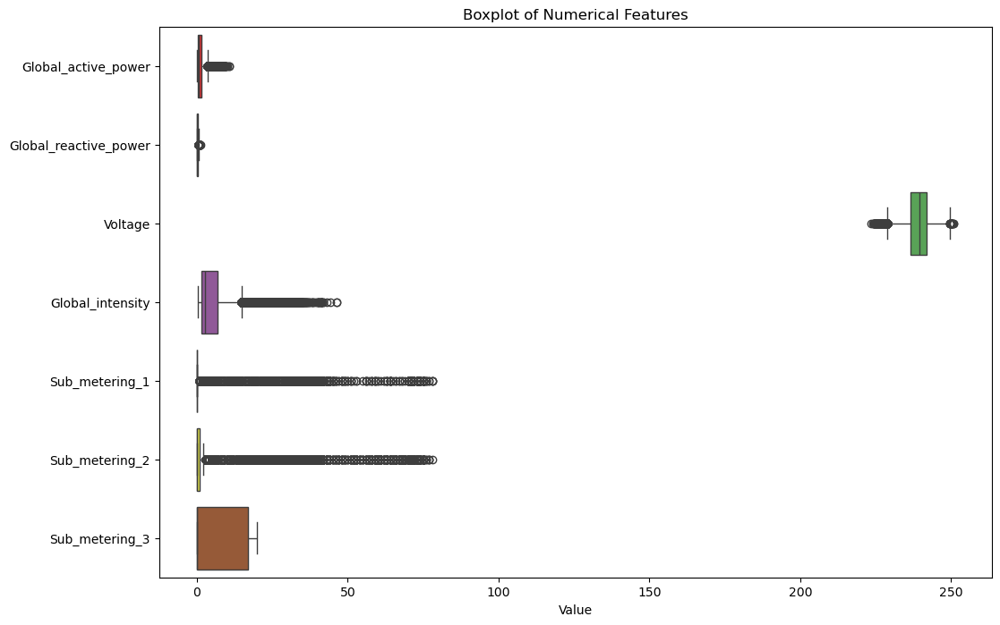

In [222]:
numeric_features = df.select_dtypes(include=['int64', 'float64'])
# Plot boxplot
plt.figure(figsize=(12, 8))

sns.boxplot(data=numeric_features, orient="h", palette="Set1")

plt.title('Boxplot of Numerical Features')
plt.xlabel('Value')
#plt.gcf().set_facecolor('#008080')
plt.show()
#voltage has outliers

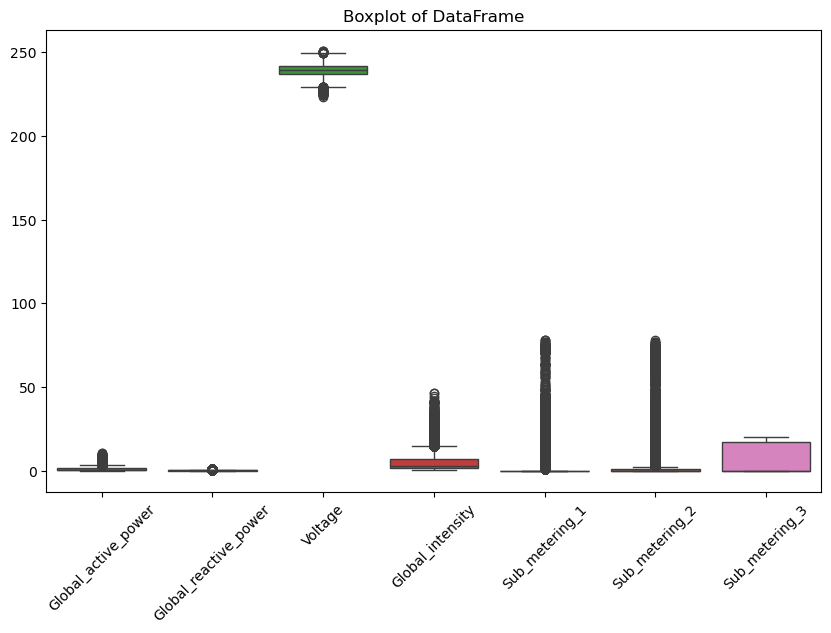

In [187]:
plt.figure(figsize=(10, 6))  
sns.boxplot(data=df)  #create boxplot utk df
plt.title('Boxplot of DataFrame')  
plt.xticks(rotation=45)  #rotate x-axis utk readability
plt.show()

## Correlation matrices

A great way to easily get a feel for **linear relationships** between variables is with a correlation matrix.

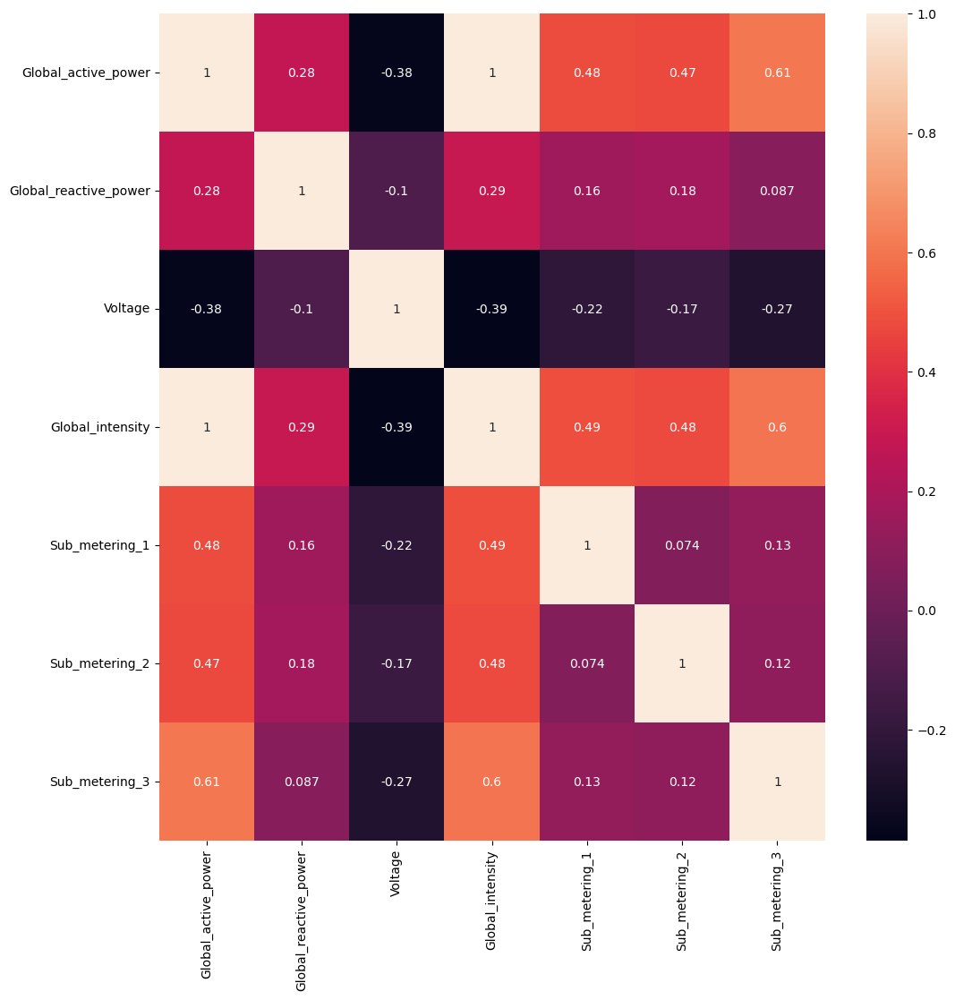

In [188]:
#by visual use heat map
plt.figure(figsize=(12,12))
sns.heatmap(df.corr(numeric_only=True), annot=True);
#annot_true to display value inside the heatmap 

In [189]:
#event per month

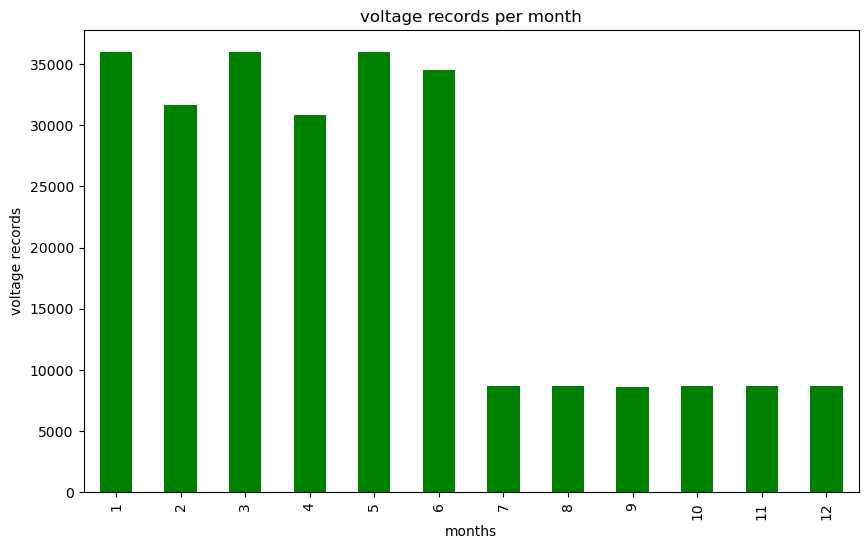

In [190]:
events_per_month = df['Date'].dt.month.value_counts().sort_index()  #for month distribution and sort them

plt.figure(figsize=(10,6))

events_per_month.plot(kind='bar', color='green')  #choose barplot

plt.title('voltage records per month') #to know the counts for how many reading records are taken for that month
plt.xlabel('months')
plt.ylabel('voltage records')
plt.show()

In [191]:
df['Date'].dt.month.unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])

In [192]:
df['Time'].unique()

array([datetime.time(0, 0), datetime.time(0, 1), datetime.time(0, 2), ...,
       datetime.time(23, 57), datetime.time(23, 58),
       datetime.time(23, 59)], dtype=object)

## Plotting over time

In [193]:
df.dtypes

Date                     datetime64[ns]
Time                             object
Global_active_power             float64
Global_reactive_power           float64
Voltage                         float64
Global_intensity                float64
Sub_metering_1                  float64
Sub_metering_2                  float64
Sub_metering_3                  float64
dtype: object

In [223]:
df.groupby(['Time']).mean().rolling(60).mean().plot(linewidth=1)
plt.title('1-HOUR AVERAGE')

DataError: Cannot aggregate non-numeric type: datetime64[ns]

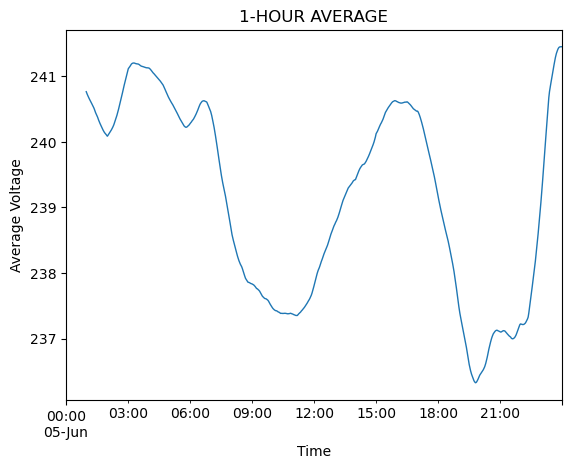

In [130]:
# Assuming you want to calculate the rolling mean of 'Voltage' grouped by 'Time'
df.groupby(['Time'])['Voltage'].mean().rolling(60).mean().plot(linewidth=1)
plt.title('1-HOUR AVERAGE')
plt.xlabel('Time')
plt.ylabel('Average Voltage')
plt.show()

### Plot Active and Reactive average power usage  in span of 30 days 

In [131]:
df['Global_reactive_power'].isnull().sum()

0

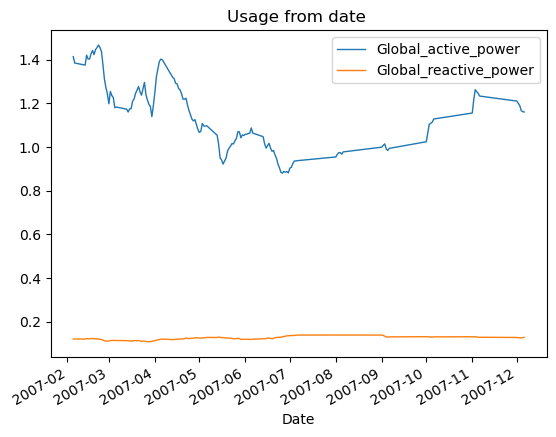

In [132]:
df.groupby(['Date']).mean()[['Global_active_power','Global_reactive_power']].rolling(30).mean().plot(linewidth=1)
plt.title('Usage from date ')
plt.show()

C:\Users\najib\AppData\Local\Temp\ipykernel_13184\4135438222.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['Sub_metering_3'],


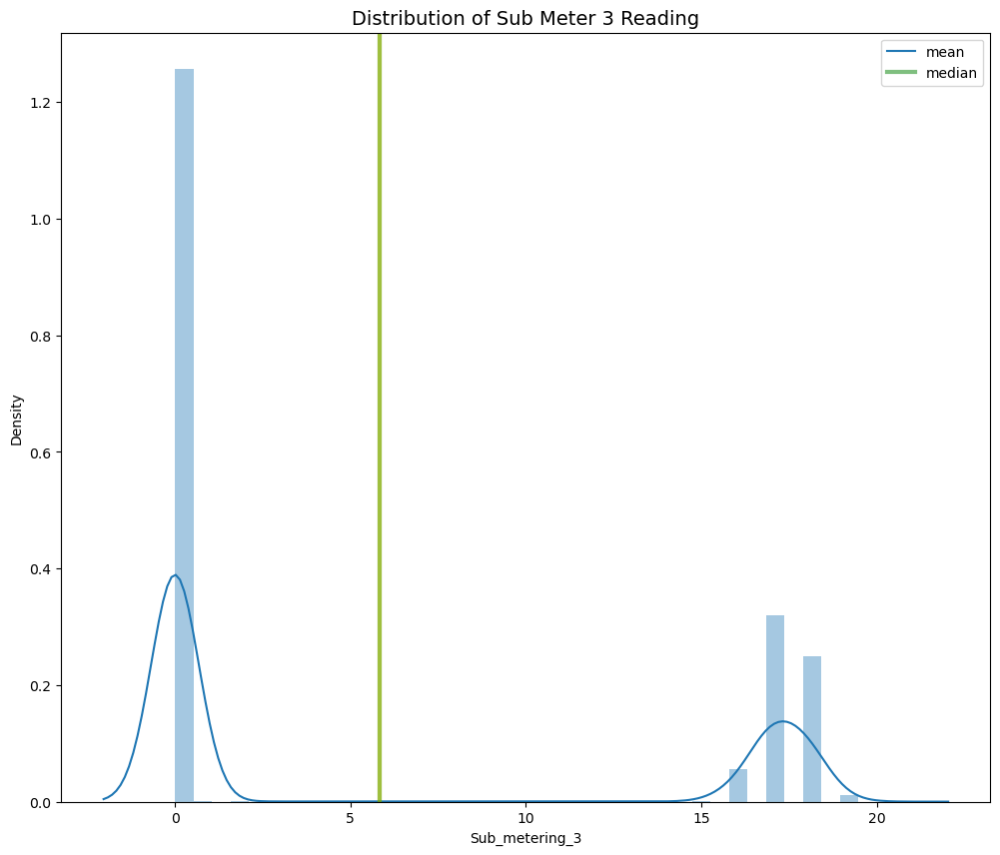

In [133]:
plt.figure(figsize=(12,10))
sns.distplot(df['Sub_metering_3'],
             kde=True)
plt.axvline(x=df.Sub_metering_3.mean(), 
            linewidth=3, color='g', label="mean", alpha=0.5)
plt.axvline(x=df.Sub_metering_3.mean(), 
            linewidth=3, color='y', label="median", alpha=0.5)

# set title, legends and labels
plt.title("Distribution of Sub Meter 3 Reading", size=14)
plt.legend(["mean", "median"])
#dense on the left side - rightskewness?
#bacaan jarang tinggi

C:\Users\najib\AppData\Local\Temp\ipykernel_13184\758682581.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(np.log1p(df['Sub_metering_3']),


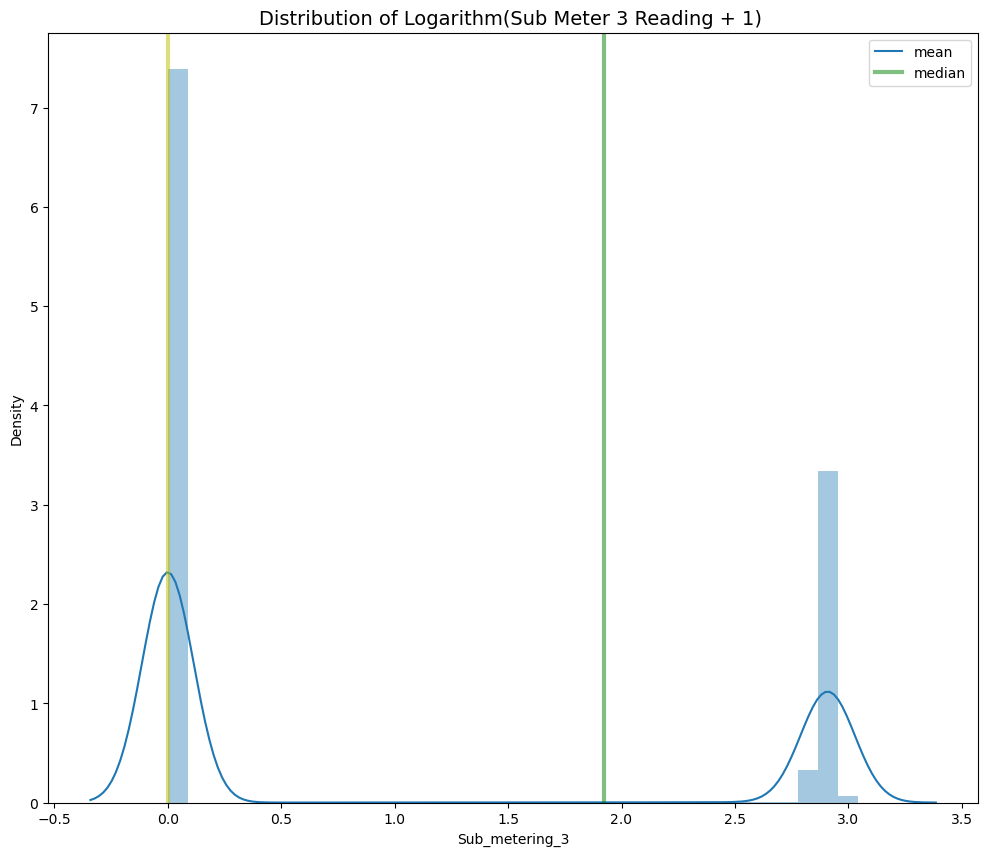

In [134]:
# set the plot size
#figsize(12,10)
plt.figure(figsize=(12,10))
# set the histogram, mean and median
sns.distplot(np.log1p(df['Sub_metering_3']),
             kde=True)
plt.axvline(x=np.log1p(df.Sub_metering_3.mean()), 
            linewidth=3, color='g', label="mean", alpha=0.5)
plt.axvline(x=np.log1p(df.Sub_metering_3.median()), 
            linewidth=3, color='y', label="median", alpha=0.5)

# set title, legends and labels
plt.title("Distribution of Logarithm(Sub Meter 3 Reading + 1) ", size=14)
plt.legend(["mean", "median"])

### Scatter plot of meter reading VS date

In [135]:
# for visualization: plotly
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objects as go
import plotly.express as px
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
from plotly.offline import iplot

In [136]:
fig = px.scatter(df, x="Global_active_power", y="Sub_metering_3", 
                 color="Sub_metering_3", hover_data=['Sub_metering_3'])

fig.update_layout(title_text='Sub Meter Reading VS Global Active Power')
fig.show()

In [ ]:
# Set the datetime column as the index
df.set_index('Datetime', inplace=True)

In [138]:
df.head()
#issue with voltage and active?

,Date,Time,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
0,2007-01-01,2024-06-05 00:00:00,2.580,0.136,241.97,10.6,0.0,0.0,0.0
1,2007-01-01,2024-06-05 00:01:00,2.552,0.100,241.75,10.4,0.0,0.0,0.0
2,2007-01-01,2024-06-05 00:02:00,2.550,0.100,241.64,10.4,0.0,0.0,0.0
3,2007-01-01,2024-06-05 00:03:00,2.550,0.100,241.71,10.4,0.0,0.0,0.0
4,2007-01-01,2024-06-05 00:04:00,2.554,0.100,241.98,10.4,0.0,0.0,0.0


Start modelling here

In [141]:
# Convert DataFrame to CSV
df.to_csv('household_power_consumption_cleaned.csv', index=False)

<Axes: >

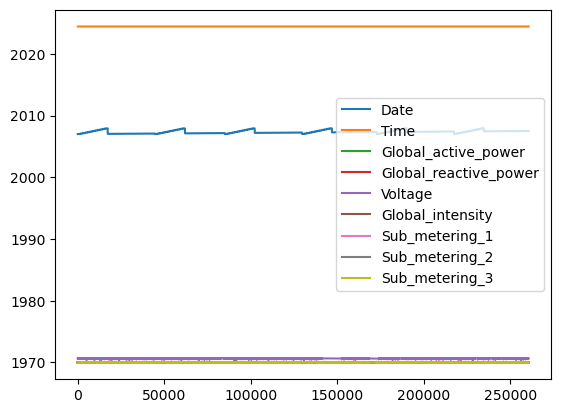

In [137]:
df.plot()

In [ ]:
np.log(df)

df.plot()


In [142]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

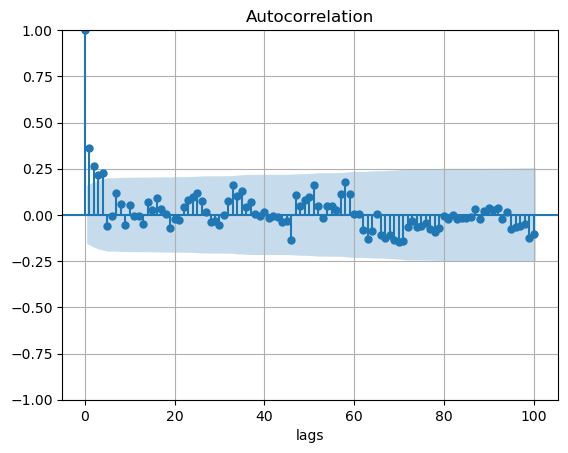

In [145]:
## PLOTTING AUTO CORRELATION AND PARTIAL CORRELATION
plot_acf(df.groupby(['Date']).mean()['Global_active_power'][:'2007-08'],lags=100,title="Global Reactive Power")
plt.xlabel('lags')
plt.title('Autocorrelation')
plt.grid()
plt.show()